In [1]:
# https://tech.fusic.co.jp/posts/2020-01-20-remove-background/
!pip install opencv-python
!pip install matplotlib
!pip install torch
!pip install torchvision

In [9]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

import torch
import torchvision
from torchvision import transforms

import os
import matplotlib.pyplot as plt

In [10]:
import glob

files = glob.glob(os.getcwd() + '/img/*')
for file in files:
    print(file)

/Users/motacapla/Coding/Web/Tutter/api_server/flask/fish_detector/img/8.jpg
/Users/motacapla/Coding/Web/Tutter/api_server/flask/fish_detector/img/9.jpg
/Users/motacapla/Coding/Web/Tutter/api_server/flask/fish_detector/img/10.jpg
/Users/motacapla/Coding/Web/Tutter/api_server/flask/fish_detector/img/4.jpg
/Users/motacapla/Coding/Web/Tutter/api_server/flask/fish_detector/img/5.jpg
/Users/motacapla/Coding/Web/Tutter/api_server/flask/fish_detector/img/7.jpg
/Users/motacapla/Coding/Web/Tutter/api_server/flask/fish_detector/img/6.jpg
/Users/motacapla/Coding/Web/Tutter/api_server/flask/fish_detector/img/2.jpg
/Users/motacapla/Coding/Web/Tutter/api_server/flask/fish_detector/img/3.jpg
/Users/motacapla/Coding/Web/Tutter/api_server/flask/fish_detector/img/1.jpg


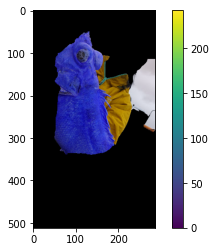

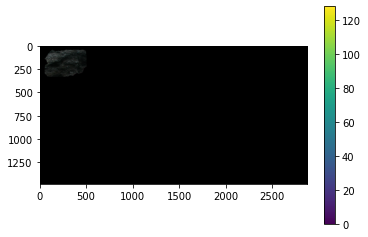

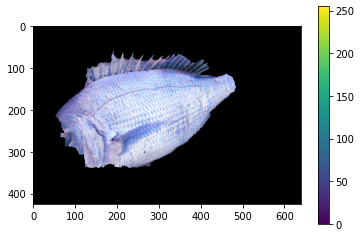

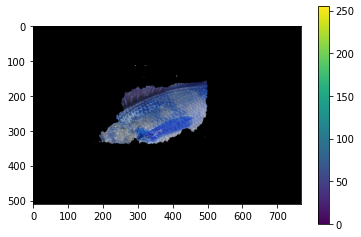

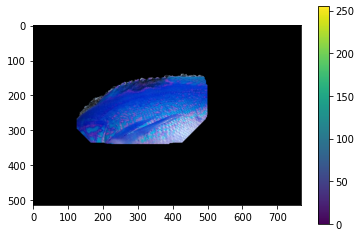

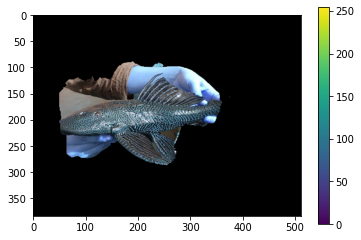

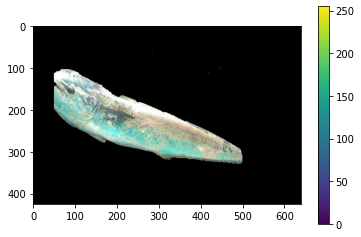

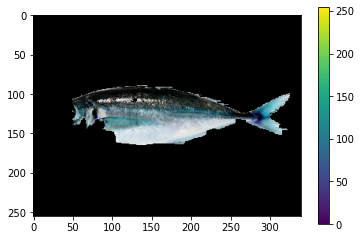

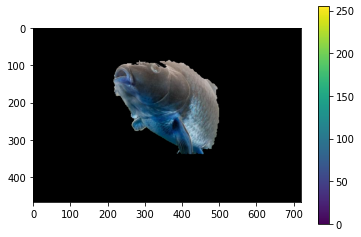

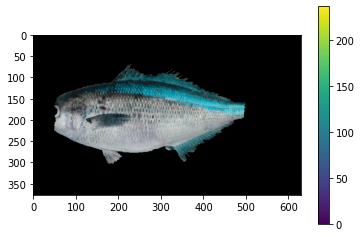

In [6]:
"""
grab cut
"""
import numpy as np
import cv2
from matplotlib import pyplot as plt

for file in files:
    img = cv2.imread(file)
    mask = np.zeros(img.shape[:2],np.uint8)

    bgdModel = np.zeros((1,65),np.float64)
    fgdModel = np.zeros((1,65),np.float64)

    rect = (50,50,450,290)
    cv2.grabCut(img,mask,rect,bgdModel,fgdModel,5,cv2.GC_INIT_WITH_RECT)

    mask2 = np.where((mask==2)|(mask==0),0,1).astype('uint8')
    img = img*mask2[:,:,np.newaxis]

    plt.imshow(img),plt.colorbar(),plt.show()

In [11]:
def create_mask_with_semantic_segmentation(image_path, output_path): 
    img = cv2.imread(image_path)
    #plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB)) 
    #plt.show()
    
    img = img[...,::-1] 
    h,w,_ = img.shape
    img = cv2.resize(img,(320,320))
    
    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
    model = torchvision.models.segmentation.deeplabv3_resnet101(pretrained=True)
    model = model.to(device)
    model.eval();
    
    preprocess = transforms.Compose([
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    ])
    input_tensor = preprocess(img)
    input_batch = input_tensor.unsqueeze(0).to(device)
    
    with torch.no_grad():
        output = model(input_batch)['out'][0]
    output = output.argmax(0)
    mask = output.byte().cpu().numpy()
    mask = cv2.resize(mask,(w,h))
    img = cv2.resize(img,(w,h))
    plt.gray()
    plt.figure(figsize=(20,20))
    plt.subplot(1,2,1)
    plt.imshow(img)
    plt.subplot(1,2,2)
    plt.imshow(mask);
    plt.show()
    
    cv2.imwrite(output_path, mask)
    
    return img, mask

In [12]:
def get_filepath(dir_name, suffix):
    base_path = os.getcwd() + "/" + dir_name + "/"
    if not os.path.exists(base_path):
        os.mkdir(base_path)
    return base_path + file.split("/")[-1].split(".")[0] + "_" + suffix + "." + file.split(".")[1] 

<Figure size 432x288 with 0 Axes>

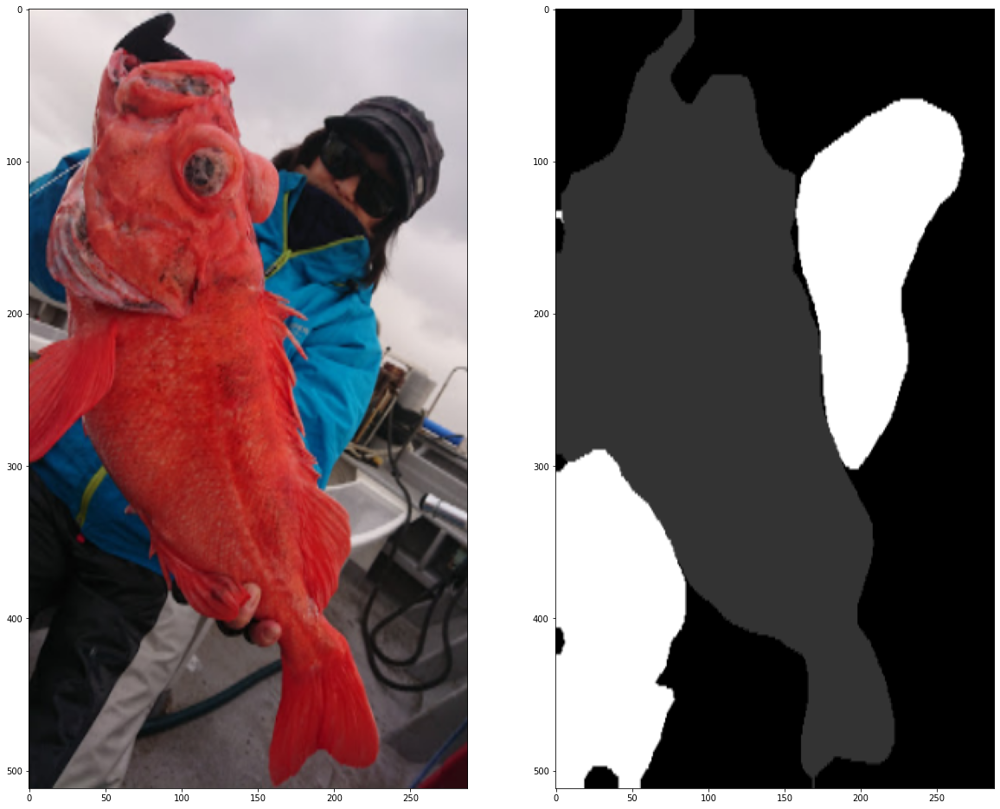

<Figure size 432x288 with 0 Axes>

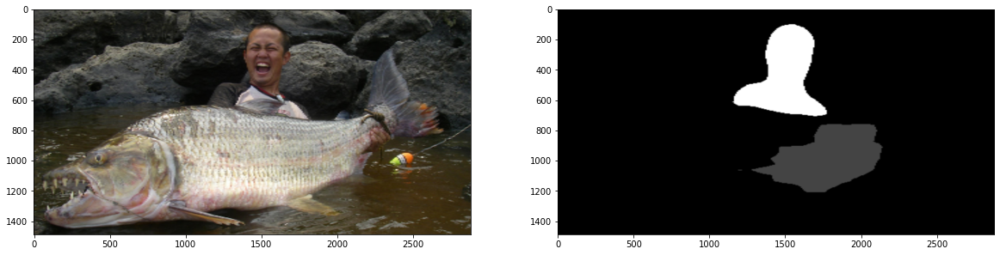

<Figure size 432x288 with 0 Axes>

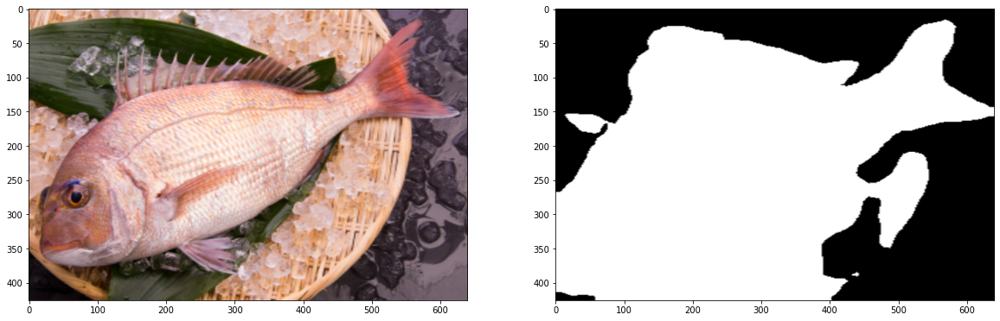

<Figure size 432x288 with 0 Axes>

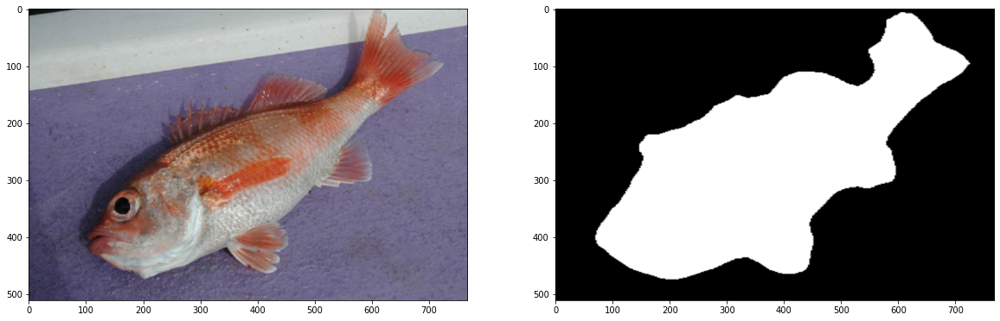

<Figure size 432x288 with 0 Axes>

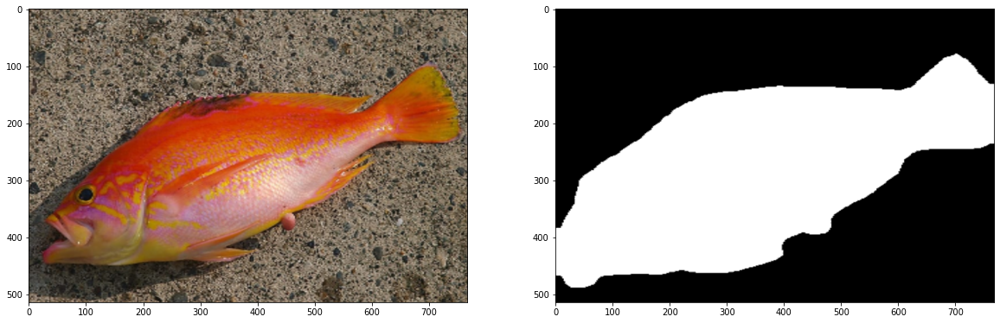

<Figure size 432x288 with 0 Axes>

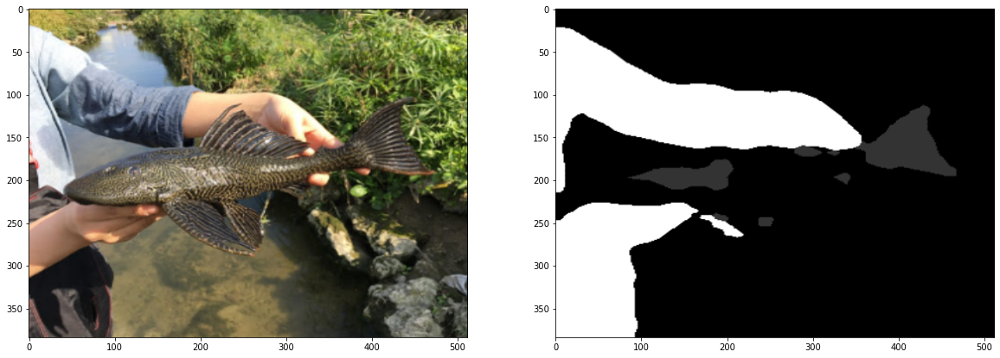

<Figure size 432x288 with 0 Axes>

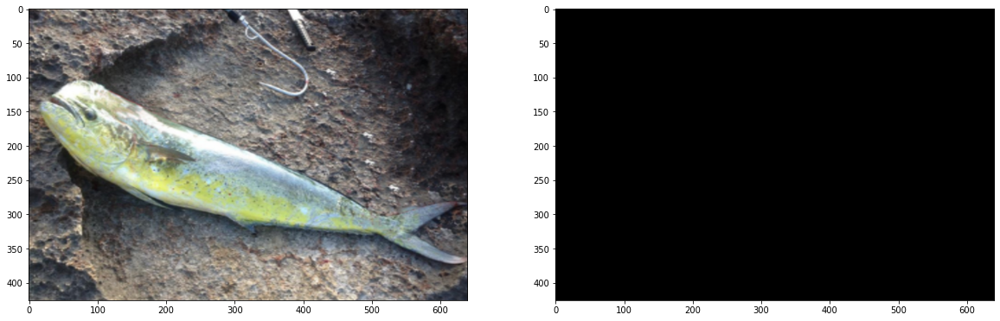

<Figure size 432x288 with 0 Axes>

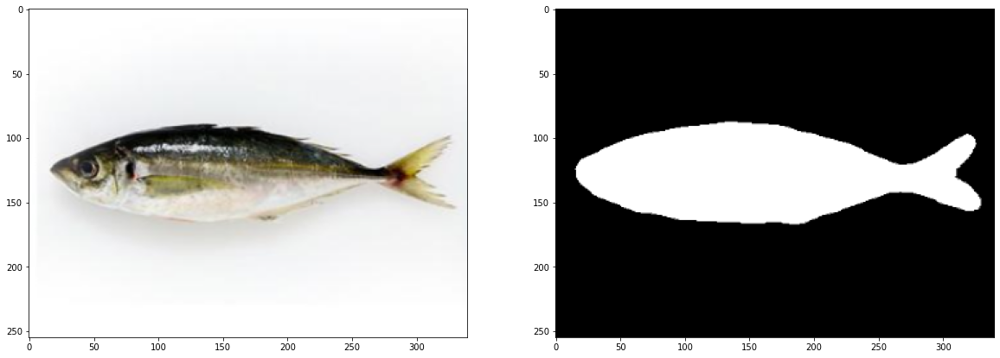

<Figure size 432x288 with 0 Axes>

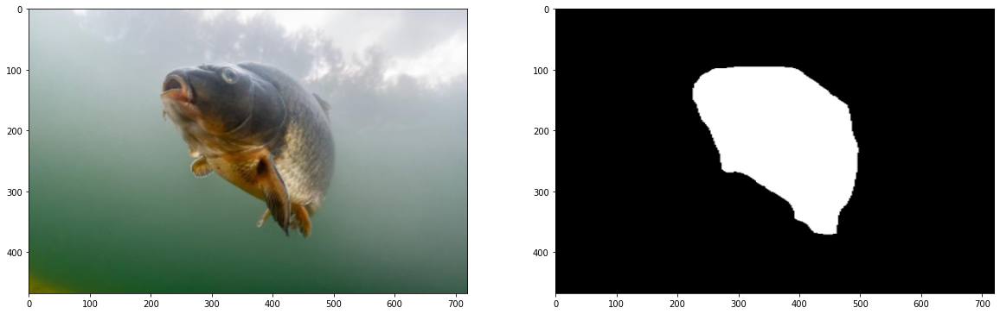

<Figure size 432x288 with 0 Axes>

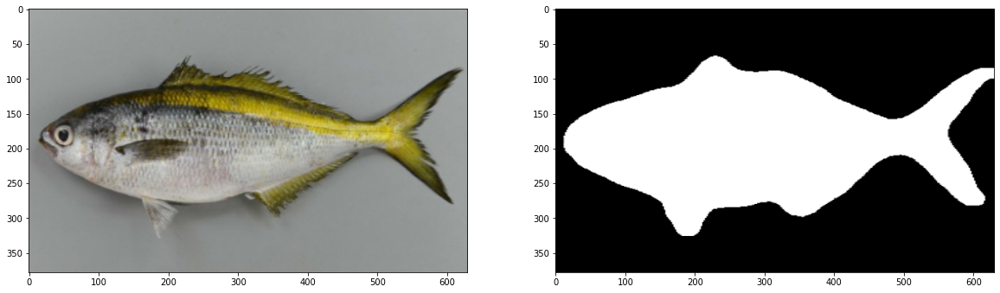

In [51]:
img_list = []
mask_list = []
for file in files:
    img, mask = create_mask_with_semantic_segmentation(file, get_filepath("mask_img", "mask") )
    img_list.append(img)
    mask_list.append(mask)

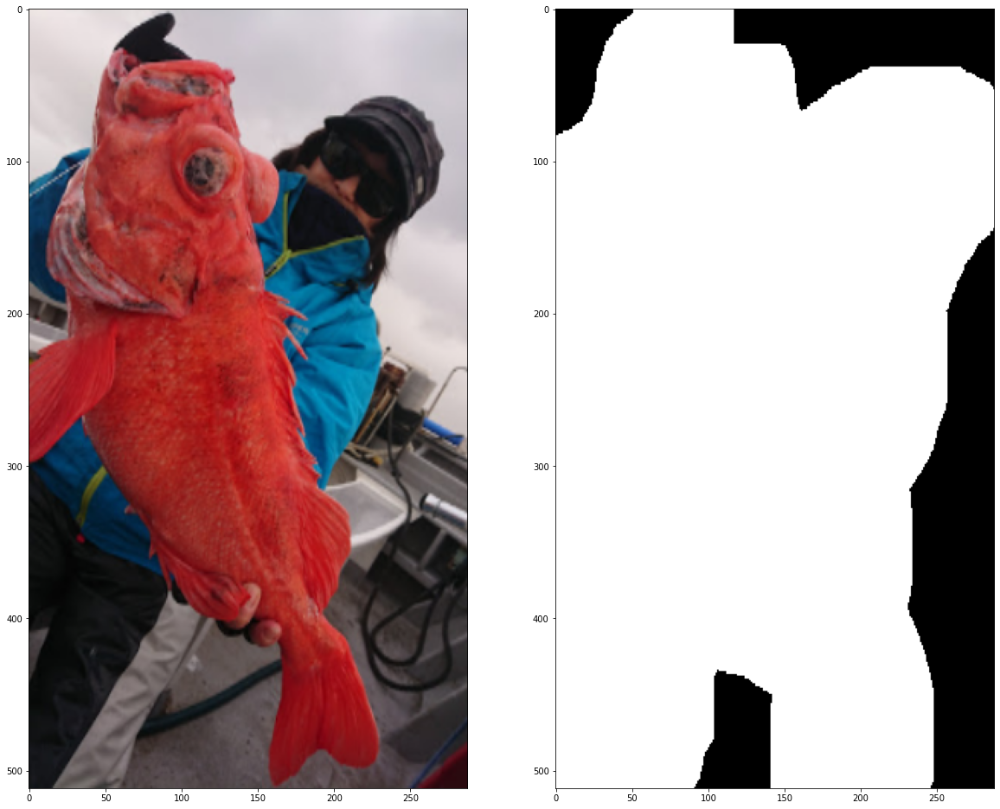

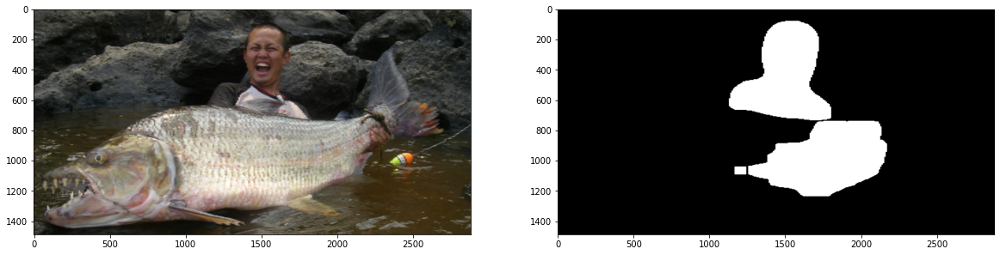

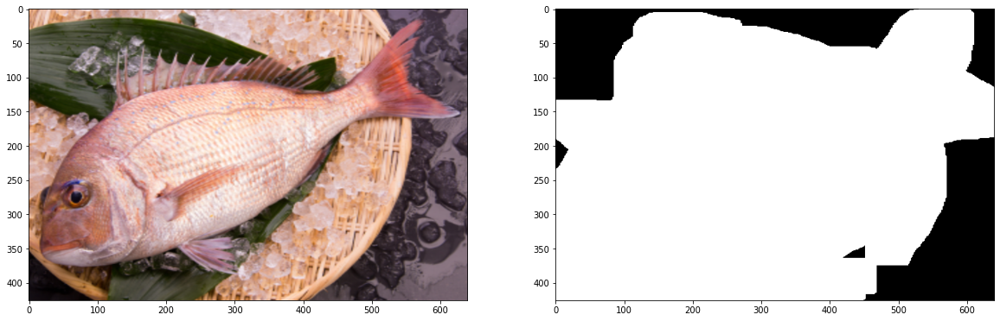

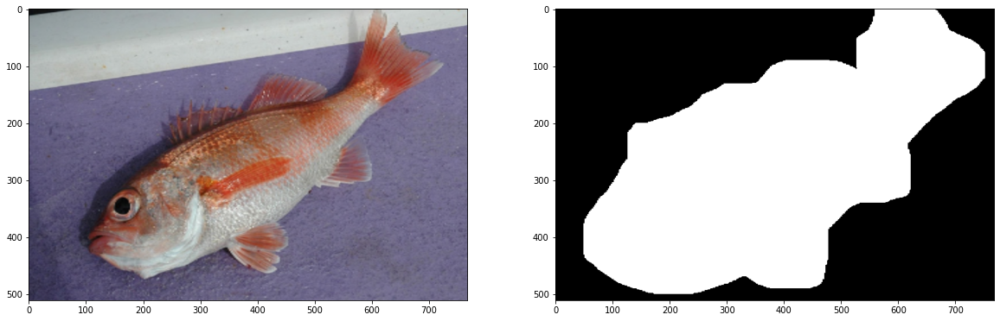

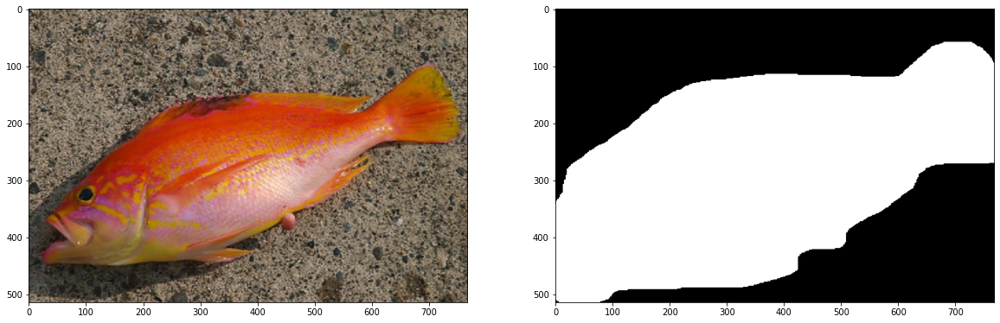

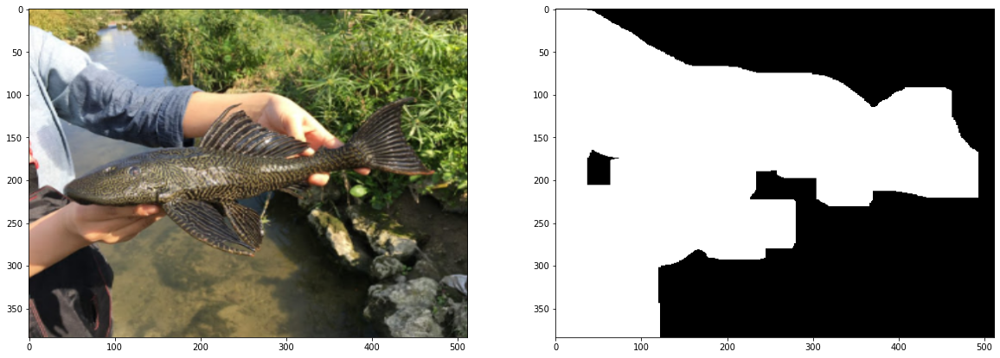

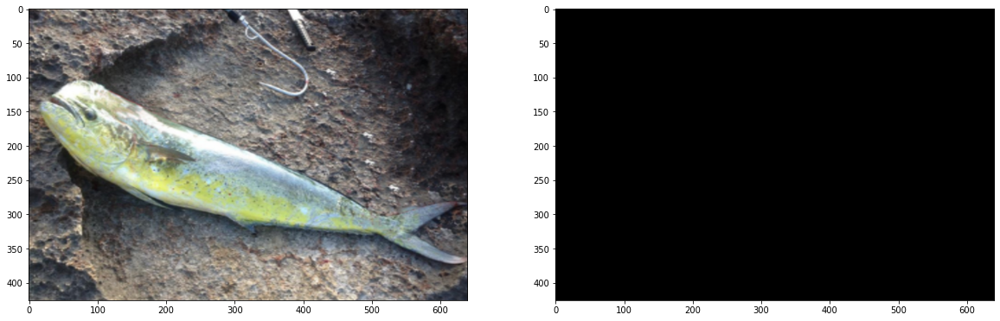

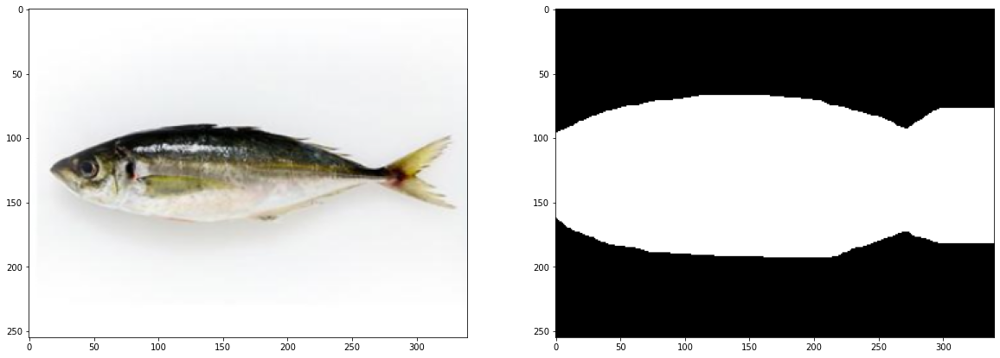

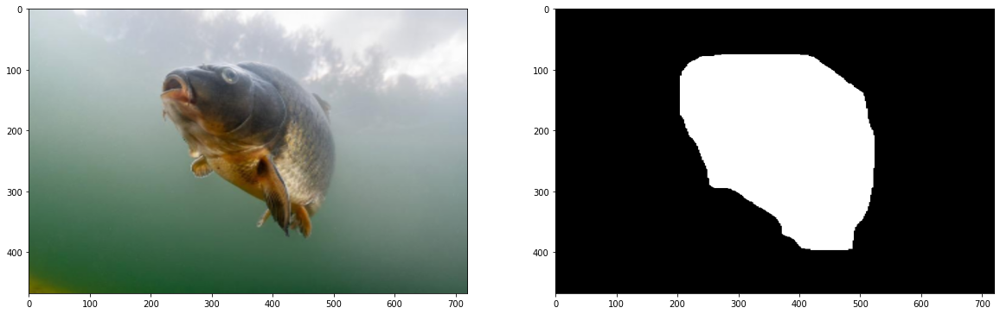

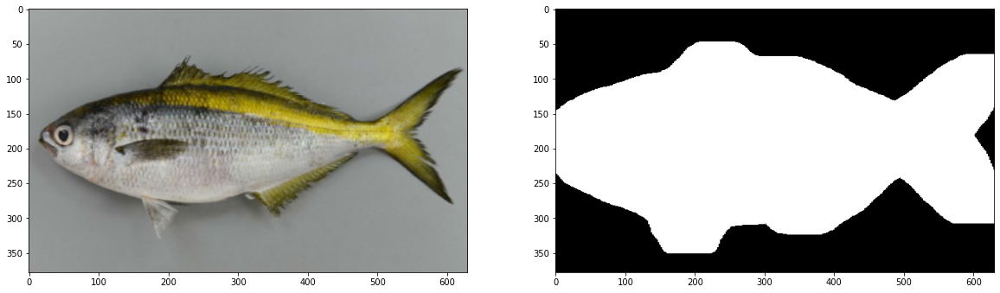

In [14]:
def generate_trimap(mask, k_size=(5,5), ite=1):
    kernel = np.ones(k_size, np.uint8)
    eroded = cv2.erode(mask, kernel, iterations = ite)
    dilated = cv2.dilate(mask, kernel, iterations = ite)
    trimap = np.full(mask.shape, 128)
    trimap[eroded == 255] = 255
    trimap[dilated == 0] = 0
    return trimap

for img, mask in zip(img_list, mask_list):
    trimap = generate_trimap(mask, k_size=(10, 10), ite=5)
    cv2.imwrite(get_filepath("trimap_img", "trimap"), trimap)
    plt.figure(figsize=(20, 20))
    plt.subplot(1, 2, 1)
    plt.imshow(img)
    plt.subplot(1, 2, 2)
    plt.imshow(trimap)

In [15]:
# IndexNet Matting
#!git clone https://github.com/poppinace/indexnet_matting

In [39]:
mask_list[0][15]

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 2, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,
       3, 3, 3, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0], dtype=uint8)

In [52]:
def apply_mask_to_img(img, mask):
    plt.figure(figsize=(20, 20))
    plt.subplot(1, 2, 1)
    plt.imshow(img)
        
    mylist = [(x, y) for x in range(len(mask)) for y in range(len(mask[0]))]
    
    """
    for x, y in mylist:
        if (mask[x, y] == 0):
            img[x, y, 0] = 255
            img[x, y, 1] = 255
            img[x, y, 2] = 255     
    """
    img[mask == 0][:] = 255
    
    
    # ng
    """
    img[:, :, 0] *= mask[: , :]
    img[:, :, 1] *= mask[: , :]
    img[:, :, 2] *= mask[: , :]
    
    img[img == 0] = 255
    img[img != 255] = 0
    """
    
    # ng
    """
    mask[mask == 0] = 255
    mask[mask != 255] = 0
    
    r = img[:, :, 0]
    g = img[:, :, 1]
    b = img[:, :, 2]
    
    r = r * mask
    g = g * mask
    b = b * mask
    
    img[:, :, 0] = r
    img[:, :, 1] = g
    img[:, :, 2] = b
    
    """
    
    plt.subplot(1, 2, 2)
    plt.imshow(img)
    #cv2.imwrite(get_filepath("result_img", "result"), cv2.cvtColor(img, cv2.COLOR_RGB2BGR))

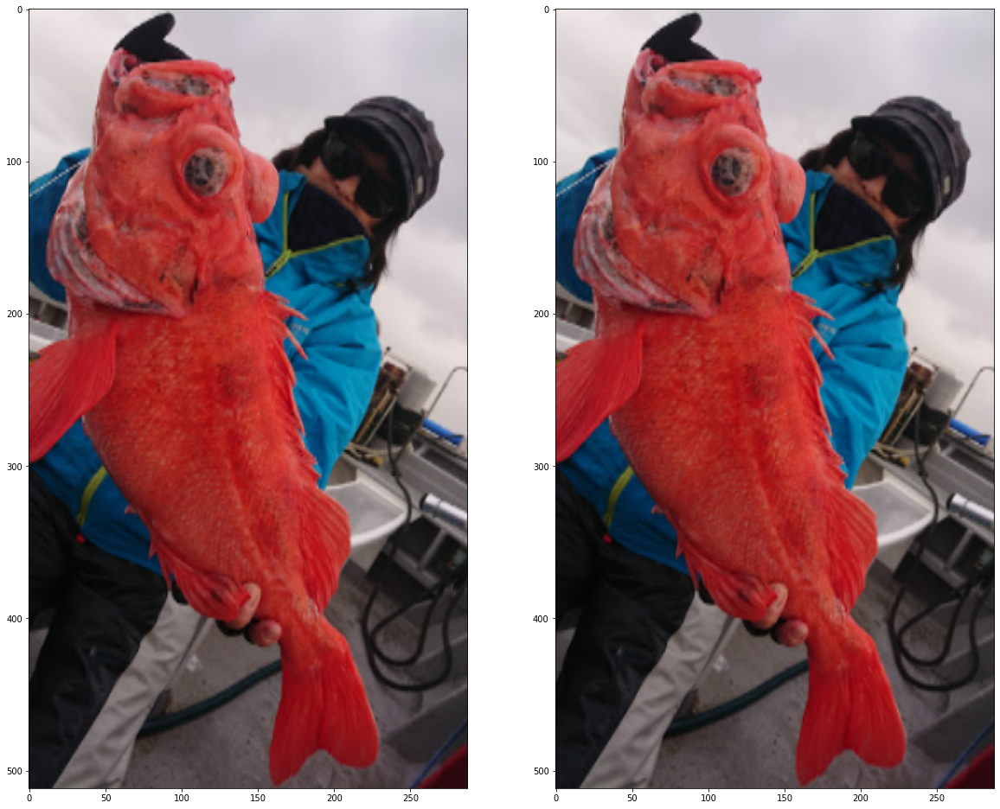

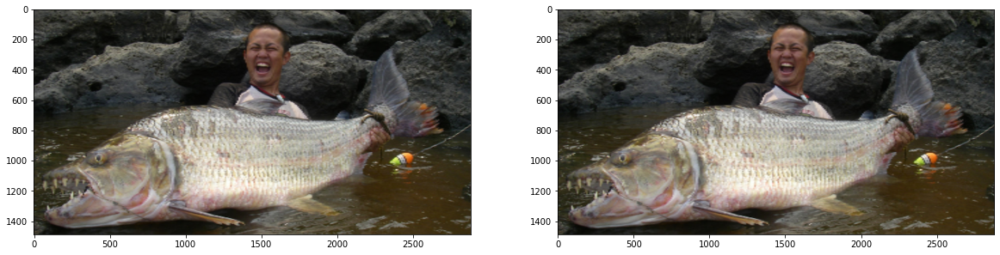

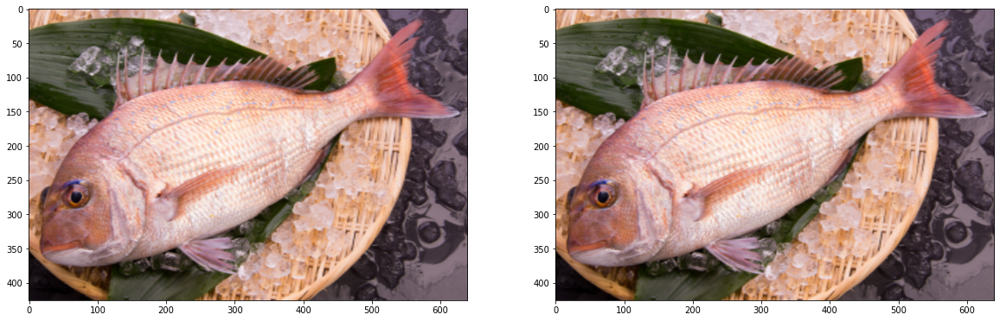

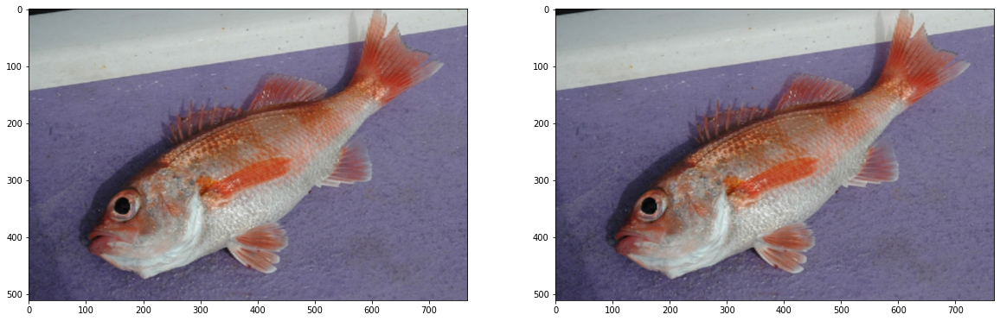

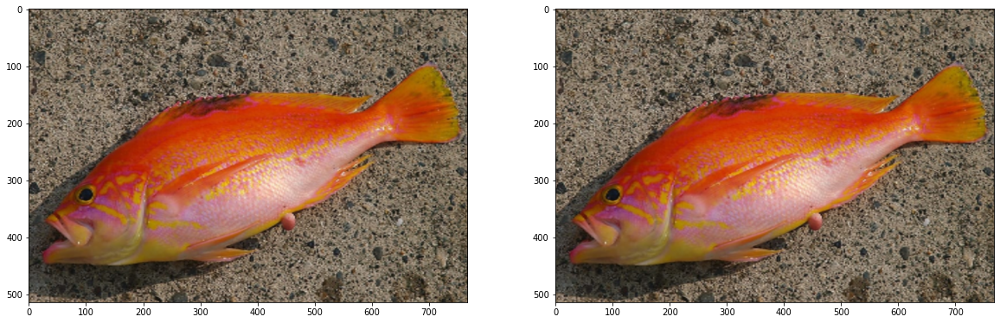

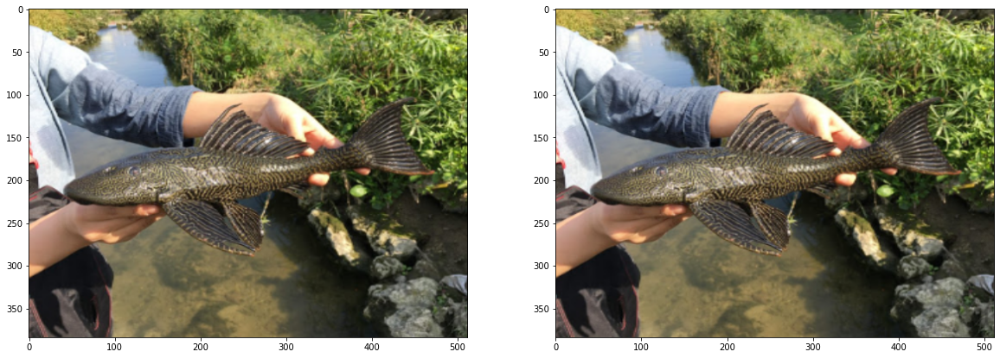

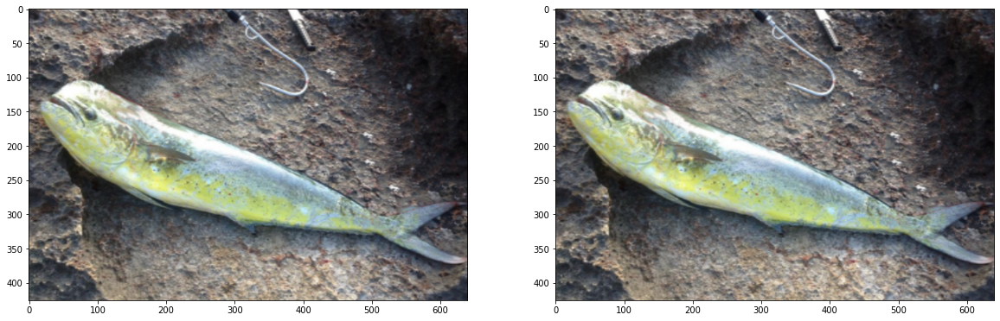

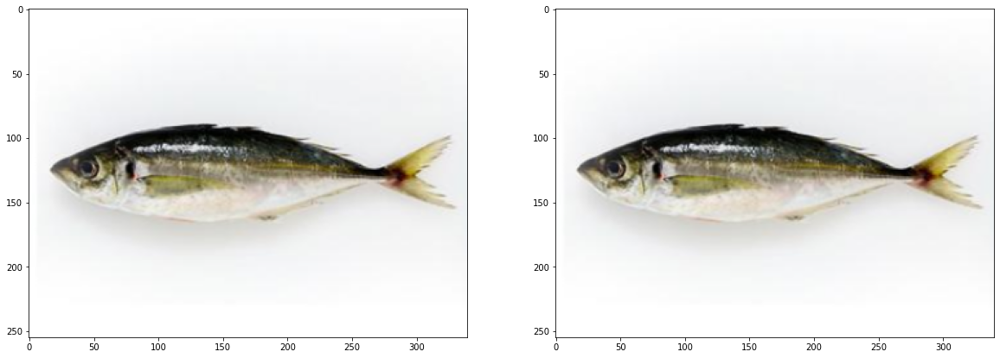

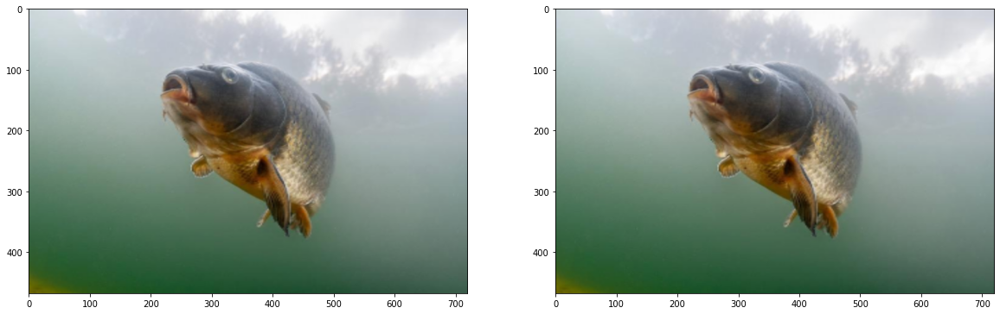

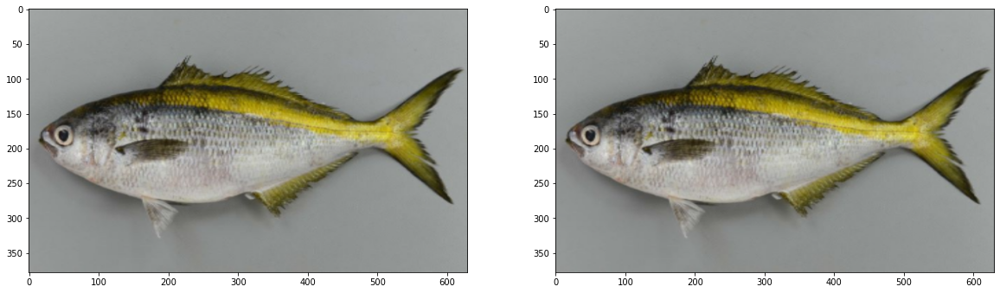

In [53]:
for img, mask in zip(img_list, mask_list):
    apply_mask_to_img(img, mask)